# Deep Feature Exploration (ResNet-50)

Analyze and visualize ResNet-50 deep learning features for image similarity.

**Features:**
- Query-based feature analysis
- Group-based visualizations
- Feature attribution with Grad-CAM
- Nearest neighbor analysis

In [19]:
# Standard library
import warnings
from pathlib import Path

# Third-party
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

# Project utilities
from sim_bench.analysis import utils, feature_utils, feature_viz

warnings.filterwarnings('ignore')
%matplotlib inline

## 1. Configuration

In [20]:
# Project paths
PROJECT_ROOT = utils.get_project_root()
FEATURE_CACHE_DIR = PROJECT_ROOT / "artifacts" / "feature_cache"
OUTPUT_DIR = PROJECT_ROOT / "outputs" / "deep_feature_exploration"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Method and dataset
METHOD_NAME = "deep"  # This notebook is specifically for ResNet-50 features
DATASET_TYPE = "ukbench"  # Options: 'ukbench', 'holidays'

# Query selection
# Specify which images to analyze (use query_idx from per_query.csv)
# QUERY_INDICES = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]  # First 10 queries
QUERY_INDICES = list(range(7144, 7152))  # Modify these to your desired query indices

print(f"Configuration:")
print(f"  Project Root: {PROJECT_ROOT}")
print(f"  Method: {METHOD_NAME}")
print(f"  Dataset: {DATASET_TYPE}")
print(f"  Feature Cache: {FEATURE_CACHE_DIR}")
print(f"  Output: {OUTPUT_DIR}")
print(f"  Queries: {len(QUERY_INDICES)} selected")

Configuration:
  Project Root: D:\sim-bench
  Method: deep
  Dataset: ukbench
  Feature Cache: D:\sim-bench\artifacts\feature_cache
  Output: D:\sim-bench\outputs\deep_feature_exploration
  Queries: 8 selected


## 2. Load Features

In [21]:
# Find and load feature cache
cache_file = feature_utils.find_cache_for_method(METHOD_NAME, FEATURE_CACHE_DIR)

if cache_file is None:
    raise FileNotFoundError(
        f"No cache found for method '{METHOD_NAME}'. "
        f"Please run an experiment first to generate features."
    )

print(f"Loading features from cache: {cache_file.name}")

# Load full dataset features and metadata
features, metadata = feature_utils.load_features_from_cache(
    cache_file, return_metadata=True
)
image_paths = metadata['image_paths']

print(f"\n✓ Loaded {len(features)} feature vectors")
print(f"  Feature dimension: {features.shape[1]}")
print(f"  Feature range: [{features.min():.4f}, {features.max():.4f}]")

Loading features from cache: deep_f8604af13f51e8f3.pkl

✓ Loaded 10200 feature vectors
  Feature dimension: 2048
  Feature range: [0.0000, 0.9517]


## 3. Extract Query Features & Groups

In [22]:
# Extract features for selected queries
query_features = feature_utils.get_features_by_index(QUERY_INDICES, cache_file)
query_paths = [feature_utils.get_image_path_by_index(idx, cache_file) 
               for idx in QUERY_INDICES]

# Extract group IDs
all_group_ids = feature_utils.extract_group_labels_from_paths(
    image_paths, DATASET_TYPE
)
query_group_ids = [all_group_ids[idx] for idx in QUERY_INDICES]

print(f"✓ Extracted features for {len(QUERY_INDICES)} queries")
print(f"  Features shape: {query_features.shape}")
print(f"\nQuery images:")
for idx, path, gid in zip(QUERY_INDICES, query_paths, query_group_ids):
    print(f"  [{idx:4d}] Group {gid:3d}: {Path(path).name}")

print(f"\nGroups in selection: {sorted(set(query_group_ids))}")

✓ Extracted features for 8 queries
  Features shape: (8, 2048)

Query images:
  [7144] Group 1786: ukbench07144.jpg
  [7145] Group 1786: ukbench07145.jpg
  [7146] Group 1786: ukbench07146.jpg
  [7147] Group 1786: ukbench07147.jpg
  [7148] Group 1787: ukbench07148.jpg
  [7149] Group 1787: ukbench07149.jpg
  [7150] Group 1787: ukbench07150.jpg
  [7151] Group 1787: ukbench07151.jpg

Groups in selection: [1786, 1787]


## 4. Feature Statistics

In [23]:
# Compute comprehensive statistics
stats_df = feature_utils.compute_feature_statistics(features)

print("Feature Statistics Summary:")
print(stats_df[['mean', 'std', 'min', 'max', 'median']].describe())

print(f"\nMost variable dimensions (top 10 by std):")
top_var = stats_df.nlargest(10, 'std')[['dimension', 'mean', 'std']]
print(top_var.to_string(index=False))

Feature Statistics Summary:
              mean          std     min          max       median
count  2048.000000  2048.000000  2048.0  2048.000000  2048.000000
mean      0.006470     0.016813     0.0     0.313458     0.000793
std       0.006497     0.011029     0.0     0.154876     0.003072
min       0.000440     0.002110     0.0     0.041838     0.000000
25%       0.002371     0.008454     0.0     0.192334     0.000000
50%       0.004583     0.014595     0.0     0.289234     0.000000
75%       0.008474     0.022393     0.0     0.406447     0.000630
max       0.099773     0.103298     0.0     0.951673     0.095213

Most variable dimensions (top 10 by std):
 dimension     mean      std
       371 0.056476 0.103298
       206 0.047555 0.084470
      1994 0.038881 0.077749
      1098 0.052720 0.072995
       370 0.039550 0.071432
      1020 0.032287 0.069806
       680 0.036731 0.067203
       835 0.047961 0.065617
       843 0.044748 0.065439
      1146 0.099773 0.063680


## 5. Pairwise Query Distances

In [24]:
# Compute pairwise distances between queries
distances = cdist(query_features, query_features, metric='euclidean')

print(f"Pairwise distances between {len(QUERY_INDICES)} queries:\n")

# Create formatted table with group info
dist_df = pd.DataFrame(
    distances,
    index=[f"q{idx}(g{gid})" for idx, gid in zip(QUERY_INDICES, query_group_ids)],
    columns=[f"q{idx}(g{gid})" for idx, gid in zip(QUERY_INDICES, query_group_ids)]
)
print(dist_df.to_string())

# Find most similar and dissimilar pairs
np.fill_diagonal(distances, np.inf)
min_idx = np.unravel_index(distances.argmin(), distances.shape)
max_idx = np.unravel_index(distances[distances != np.inf].argmax(), distances.shape)

print(f"\nMost similar pair:")
print(f"  query_{QUERY_INDICES[min_idx[0]]} (group {query_group_ids[min_idx[0]]}) <-> "
      f"query_{QUERY_INDICES[min_idx[1]]} (group {query_group_ids[min_idx[1]]})")
print(f"  Distance: {distances[min_idx]:.4f}")

print(f"\nMost dissimilar pair:")
print(f"  query_{QUERY_INDICES[max_idx[0]]} (group {query_group_ids[max_idx[0]]}) <-> "
      f"query_{QUERY_INDICES[max_idx[1]]} (group {query_group_ids[max_idx[1]]})")
print(f"  Distance: {distances[max_idx]:.4f}")

Pairwise distances between 8 queries:

              q7144(g1786)  q7145(g1786)  q7146(g1786)  q7147(g1786)  q7148(g1787)  q7149(g1787)  q7150(g1787)  q7151(g1787)
q7144(g1786)      0.000000      0.823152      0.543967      0.423398      0.545822      0.777291      0.660873      0.711585
q7145(g1786)      0.823152      0.000000      0.768183      0.861435      0.955243      0.927689      0.839519      0.763976
q7146(g1786)      0.543967      0.768183      0.000000      0.699148      0.677611      0.764765      0.718271      0.788500
q7147(g1786)      0.423398      0.861435      0.699148      0.000000      0.581692      0.846386      0.755928      0.732665
q7148(g1787)      0.545822      0.955243      0.677611      0.581692      0.000000      0.746316      0.593281      0.684566
q7149(g1787)      0.777291      0.927689      0.764765      0.846386      0.746316      0.000000      0.678342      0.763345
q7150(g1787)      0.660873      0.839519      0.718271      0.755928      0.593281    

## 6. Nearest Neighbors Analysis

In [25]:
# Find nearest neighbors in full dataset for each query
all_distances = cdist(query_features, features, metric='euclidean')
top_k = 10

for i, query_idx in enumerate(QUERY_INDICES):
    print(f"\n{'='*80}")
    print(f"Query {query_idx} (group {query_group_ids[i]}): {Path(query_paths[i]).name}")
    print(f"{'='*80}")
    
    dists = all_distances[i]
    nearest_indices = np.argsort(dists)[:top_k]
    
    print(f"\nTop {top_k} nearest neighbors:")
    for rank, idx in enumerate(nearest_indices, 1):
        neighbor_path = image_paths[idx]
        neighbor_group = all_group_ids[idx]
        distance = dists[idx]
        is_self = "(SELF)" if idx == query_idx else ""
        same_group = "✓" if neighbor_group == query_group_ids[i] else " "
        print(f"  {same_group} {rank:2d}. idx={idx:4d} group={neighbor_group:3d}  "
              f"{Path(neighbor_path).name:30s}  dist={distance:.4f} {is_self}")


Query 7144 (group 1786): ukbench07144.jpg

Top 10 nearest neighbors:
  ✓  1. idx=7144 group=1786  ukbench07144.jpg                dist=0.0000 (SELF)
  ✓  2. idx=7147 group=1786  ukbench07147.jpg                dist=0.4234 
  ✓  3. idx=7146 group=1786  ukbench07146.jpg                dist=0.5440 
     4. idx=7148 group=1787  ukbench07148.jpg                dist=0.5458 
     5. idx=7150 group=1787  ukbench07150.jpg                dist=0.6609 
     6. idx=7151 group=1787  ukbench07151.jpg                dist=0.7116 
     7. idx=7149 group=1787  ukbench07149.jpg                dist=0.7773 
  ✓  8. idx=7145 group=1786  ukbench07145.jpg                dist=0.8232 
     9. idx=3306 group=826  ukbench03306.jpg                dist=0.9243 
    10. idx=7096 group=1774  ukbench07096.jpg                dist=0.9253 

Query 7145 (group 1786): ukbench07145.jpg

Top 10 nearest neighbors:
  ✓  1. idx=7145 group=1786  ukbench07145.jpg                dist=0.0000 (SELF)
     2. idx=7151 group=1787  ukbenc

## 7. Within-Group Feature Diversity

Analyze which feature dimensions have high variance within groups.
High variance = features are inconsistent for same-group images (potential error source).

In [26]:
# Get query features as [feature_dim, n_queries] matrix
query_feature_matrix = feature_utils.get_query_feature_matrix(
    QUERY_INDICES, cache_file
)

print(f"Query feature matrix shape: {query_feature_matrix.shape}")
print(f"  Rows (feature dimensions): {query_feature_matrix.shape[0]}")
print(f"  Columns (queries): {query_feature_matrix.shape[1]}")

Query feature matrix shape: (2048, 8)
  Rows (feature dimensions): 2048
  Columns (queries): 8


In [27]:
# Analyze within-group feature diversity
diversity_results = feature_utils.analyze_within_group_feature_diversity(
    QUERY_INDICES,
    query_group_ids,
    cache_file,
    top_k=20
)

print(f"Analyzed {len(diversity_results)} groups with 2+ images:\n")

for gid, result in sorted(diversity_results.items()):
    print(f"Group {gid}:")
    print(f"  Images in group: {result['n_images']}")
    print(f"  Query indices: {result['query_indices_in_group']}")
    print(f"  Mean feature variance: {result['mean_variance']:.6f}")
    print(f"  Max feature variance: {result['max_variance']:.6f}")
    print(f"  Top 5 most diverse dimensions: {result['top_diverse_dims'][:5].tolist()}")
    print()

Analyzed 2 groups with 2+ images:

Group 1786:
  Images in group: 4
  Query indices: [7144, 7145, 7146, 7147]
  Mean feature variance: 0.000091
  Max feature variance: 0.012479
  Top 5 most diverse dimensions: [906, 1098, 208, 367, 1139]

Group 1787:
  Images in group: 4
  Query indices: [7148, 7149, 7150, 7151]
  Mean feature variance: 0.000092
  Max feature variance: 0.007383
  Top 5 most diverse dimensions: [208, 283, 906, 442, 1834]



In [28]:
diversity_results[1786]['feature_matrix'].shape

(2048, 4)

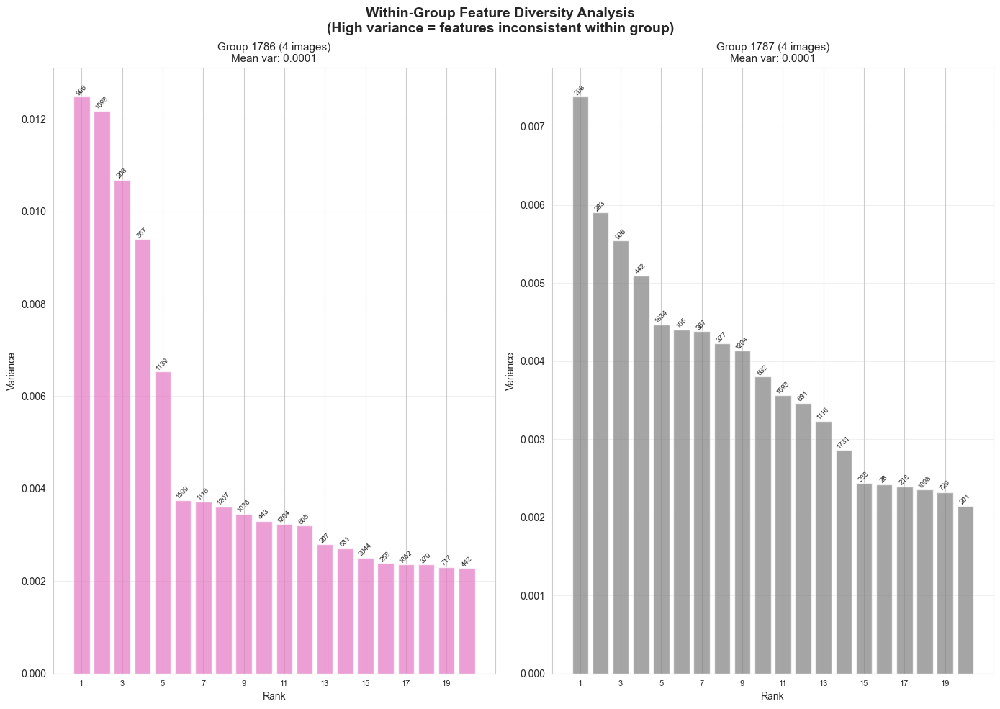

✓ Saved to: D:\sim-bench\outputs\deep_feature_exploration\within_group_diversity.png

Interpretation:
- High variance features differ significantly within the same group
- These features may cause incorrect similarity scores
- Consider investigating why same-group images vary on these dimensions


In [29]:
# Visualize within-group diversity
fig = feature_viz.plot_within_group_diversity(diversity_results)

output_file = OUTPUT_DIR / 'within_group_diversity.png'
fig.savefig(output_file, dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Saved to: {output_file}")

print("\nInterpretation:")
print("- High variance features differ significantly within the same group")
print("- These features may cause incorrect similarity scores")
print("- Consider investigating why same-group images vary on these dimensions")

## 8. Visualizations

### 7.1. Queries in Feature Space (2D Projection)

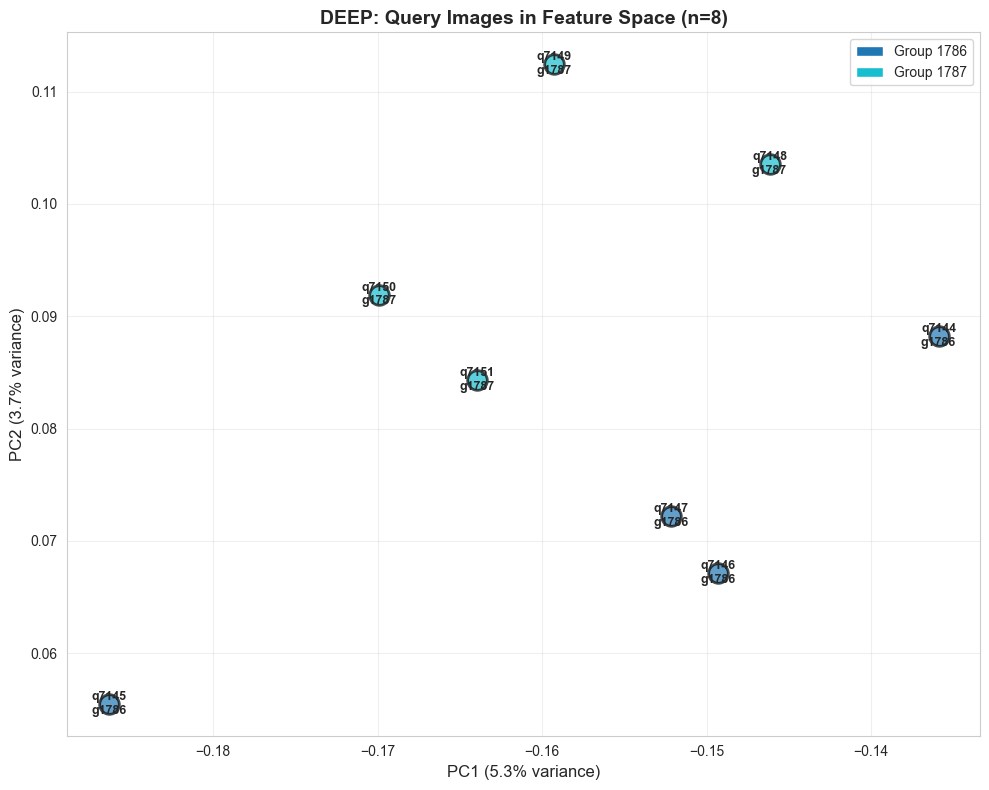

✓ Saved to: D:\sim-bench\outputs\deep_feature_exploration\queries_2d_by_group.png


In [30]:
# Visualize queries in 2D PCA space (PCA fitted on full dataset)
fig = feature_viz.plot_queries_by_group(
    query_features,
    QUERY_INDICES,
    query_group_ids,
    all_features=features,  # Fit PCA on full dataset
    method_name=METHOD_NAME
)

output_file = OUTPUT_DIR / 'queries_2d_by_group.png'
fig.savefig(output_file, dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Saved to: {output_file}")

### 7.2. Queries vs Full Dataset

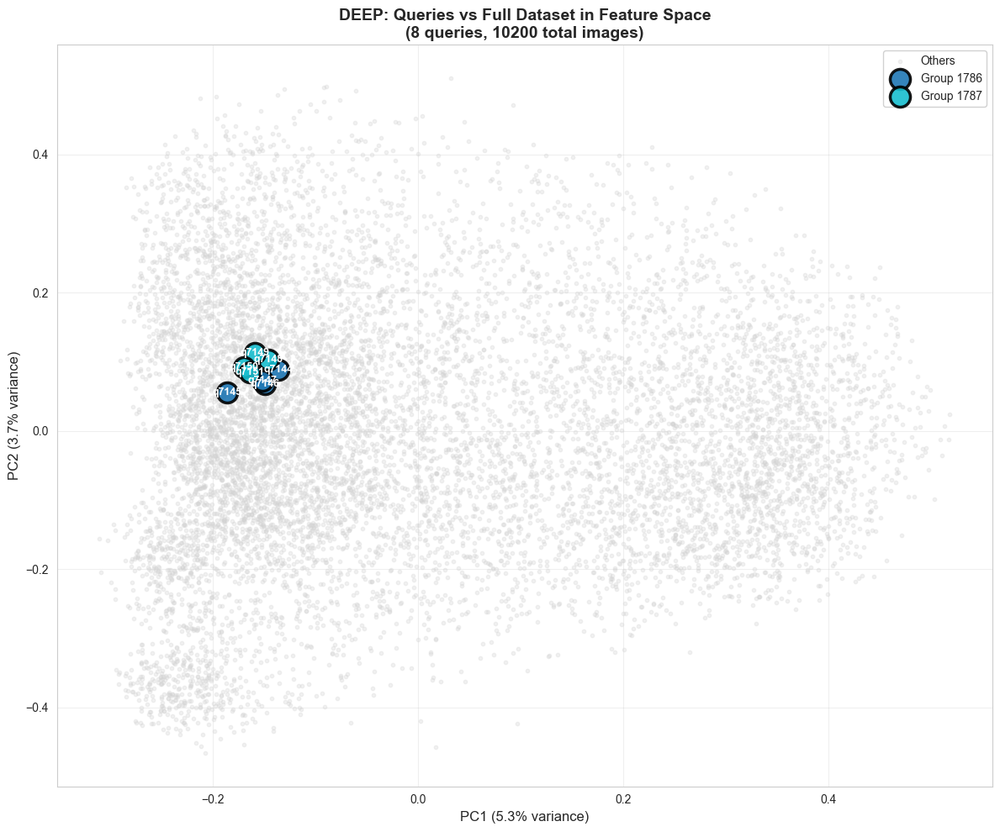

✓ Saved to: D:\sim-bench\outputs\deep_feature_exploration\queries_vs_dataset.png


In [31]:
# Visualize queries against full dataset
fig = feature_viz.plot_queries_vs_dataset_by_group(
    features,
    query_features,
    QUERY_INDICES,
    query_group_ids,
    method_name=METHOD_NAME
)

output_file = OUTPUT_DIR / 'queries_vs_dataset.png'
fig.savefig(output_file, dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Saved to: {output_file}")

### 7.3. Detailed Feature Analysis by Query

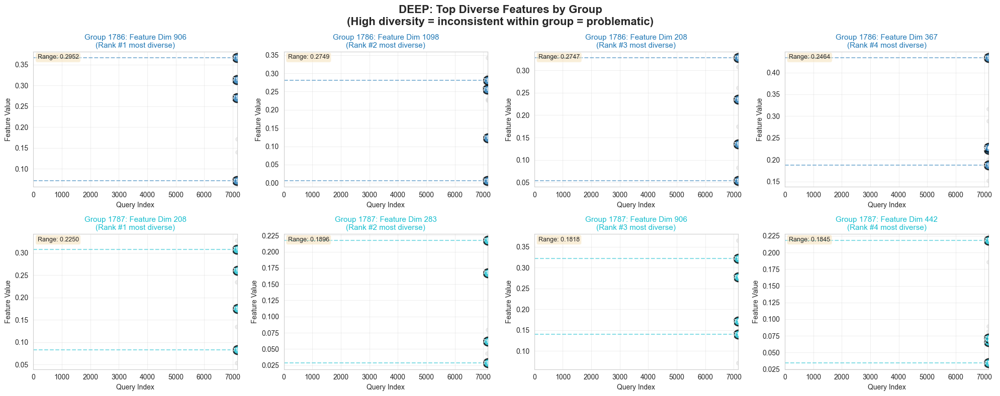

✓ Saved to: D:\sim-bench\outputs\deep_feature_exploration\diverse_features_by_group.png

Interpretation:
  - Large colored dots = queries in the highlighted group
  - Small gray dots = queries from other groups
  - Dashed lines = min/max range within the group
  - Large range = feature is inconsistent → causes retrieval errors


In [32]:
# Visualize top diverse features (problematic ones) across all queries
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Get unique groups and colors
unique_groups = sorted(set(query_group_ids))
colors = cm.tab10(np.linspace(0, 1, len(unique_groups)))
group_to_color = dict(zip(unique_groups, colors))

# For each group with diversity results, plot top 4 most diverse features
n_features_to_show = min(4, len(diversity_results[list(diversity_results.keys())[0]]['top_diverse_dims']))
n_groups = len(diversity_results)

fig, axes = plt.subplots(n_groups, n_features_to_show, 
                        figsize=(5 * n_features_to_show, 4 * n_groups))

if n_groups == 1:
    axes = axes.reshape(1, -1)

fig.suptitle(f'{METHOD_NAME.upper()}: Top Diverse Features by Group\n' +
             '(High diversity = inconsistent within group = problematic)',
             fontsize=16, fontweight='bold')

for group_idx, (gid, result) in enumerate(sorted(diversity_results.items())):
    # Get top diverse features for this group
    top_diverse_dims = result['top_diverse_dims'][:n_features_to_show]
    group_query_indices = result['query_indices_in_group']
    
    for feat_idx, dim in enumerate(top_diverse_dims):
        ax = axes[group_idx, feat_idx]
        
        # Plot feature values for ALL queries, highlight this group
        # Background: all queries
        for i, (qidx, gid_i) in enumerate(zip(QUERY_INDICES, query_group_ids)):
            feat_val = query_features[i, dim]
            
            if gid_i == gid:
                # This group: large colored markers
                ax.scatter(qidx, feat_val, s=150, 
                          c=[group_to_color[gid_i]], alpha=0.8,
                          edgecolors='black', linewidth=2, zorder=10)
                ax.text(qidx, feat_val, f'q{qidx}', 
                       fontsize=7, ha='center', va='center', 
                       fontweight='bold', color='white', zorder=11)
            else:
                # Other groups: small gray markers
                ax.scatter(qidx, feat_val, s=30, c='lightgray', 
                          alpha=0.4, zorder=1)
        
        # Add horizontal lines showing group's range
        group_feature_vals = [query_features[QUERY_INDICES.index(qi), dim] 
                             for qi in group_query_indices if qi in QUERY_INDICES]
        if group_feature_vals:
            y_min, y_max = min(group_feature_vals), max(group_feature_vals)
            ax.axhline(y_min, color=group_to_color[gid], linestyle='--', 
                      alpha=0.5, linewidth=1.5)
            ax.axhline(y_max, color=group_to_color[gid], linestyle='--', 
                      alpha=0.5, linewidth=1.5)
            
            # Show range value
            range_val = y_max - y_min
            ax.text(0.02, 0.98, f'Range: {range_val:.4f}', 
                   transform=ax.transAxes, fontsize=9, 
                   verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        ax.set_xlabel('Query Index', fontsize=10)
        ax.set_ylabel('Feature Value', fontsize=10)
        ax.set_title(f'Group {gid}: Feature Dim {dim}\n' +
                    f'(Rank #{feat_idx+1} most diverse)',
                    fontsize=11, color=group_to_color[gid])
        ax.grid(True, alpha=0.3)
        ax.set_xlim(-1, max(QUERY_INDICES) + 1)

plt.tight_layout()
output_file = OUTPUT_DIR / 'diverse_features_by_group.png'
fig.savefig(output_file, dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Saved to: {output_file}")
print(f"\nInterpretation:")
print(f"  - Large colored dots = queries in the highlighted group")
print(f"  - Small gray dots = queries from other groups")
print(f"  - Dashed lines = min/max range within the group")
print(f"  - Large range = feature is inconsistent → causes retrieval errors")

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Import analysis utilities
from sim_bench.analysis import utils, feature_utils, feature_viz

# Import ML libraries
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

# Set plotting style
sns.set_style('whitegrid')
plt.rcParams['figure.dpi'] = 100

print("✓ Imports successful")

✓ Imports successful


## 9. Feature Attribution (Grad-CAM)

Understand which parts of images contribute to features using Grad-CAM.

In [35]:
# Initialize ResNet-50 attribution extractor for Grad-CAM
from sim_bench.analysis.attribution.resnet50 import ResNet50AttributionExtractor
from sim_bench.analysis.attribution.visualization import visualize_feature_dimensions

print("Initializing ResNet-50 attribution extractor...")
extractor = ResNet50AttributionExtractor(device='cpu')  # Use 'cuda' if GPU available
print("✓ Extractor ready")

Initializing ResNet-50 attribution extractor...
✓ Extractor ready


### 8.1. Analyze Top Features per Query

In [36]:
# Initialize ResNet-50 attribution extractor for Grad-CAM
from sim_bench.analysis.attribution.resnet50 import ResNet50AttributionExtractor
from sim_bench.analysis.attribution.visualization import plot_attribution_overlay
from PIL import Image
import matplotlib.pyplot as plt

print("Initializing ResNet-50 attribution extractor...")
extractor = ResNet50AttributionExtractor(device='cpu')  # Use 'cuda' if GPU available
print("✓ Extractor ready")

Initializing ResNet-50 attribution extractor...
✓ Extractor ready


In [39]:
diversity_results.values()

dict_values([{'query_indices_in_group': [7144, 7145, 7146, 7147], 'n_images': 4, 'feature_matrix': array([[0.01786787, 0.02094372, 0.01787459, 0.02952291],
       [0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.00410991, 0.00845299, 0.        ],
       ...,
       [0.00800728, 0.03738353, 0.01164026, 0.00616417],
       [0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        ]], dtype=float32), 'top_diverse_dims_by_metric': {'variance': array([ 906, 1098,  208,  367, 1139, 1599, 1116, 1207, 1036,  443, 1204,
        605,  207,  631, 2044,  258, 1862,  370,  717,  442], dtype=int64), 'range': array([ 906, 1098,  208,  367, 1139, 1207, 1116, 1204,  443, 1599, 1036,
        605,  631, 1781,  258, 1862, 2044,  207,  442,  266], dtype=int64)}, 'top_diverse_values_by_metric': {'variance': array([0.01247872, 0.01217649, 0.01068422, 0.0093984 , 0.00653323,
       0.00375607, 0.00371908, 0.00361216, 0.00345423, 0.00330089,


### 8.2. Grad-CAM for Top Diverse Features by Group

Visualize where the model focuses for the most diverse features within each group.


GROUP 1786

Top 4 diverse features: [ 906 1098  208  367]
Variance values: [0.01247872 0.01217649 0.01068422 0.0093984 ]

--- Feature 906 (Rank 1) ---


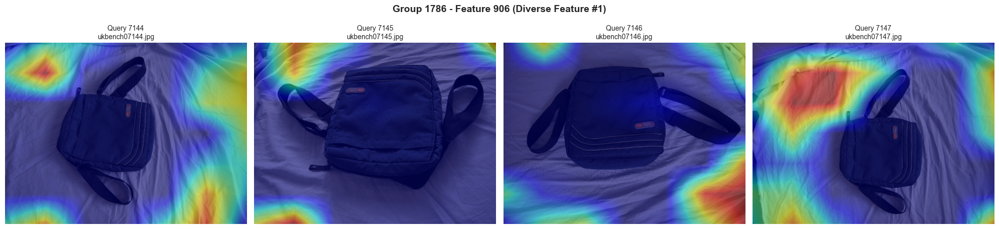


--- Feature 1098 (Rank 2) ---


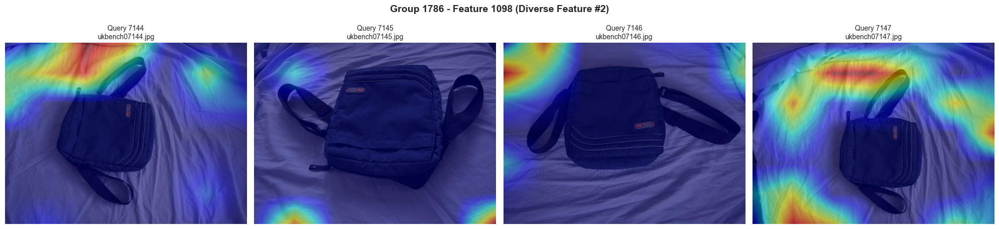


--- Feature 208 (Rank 3) ---


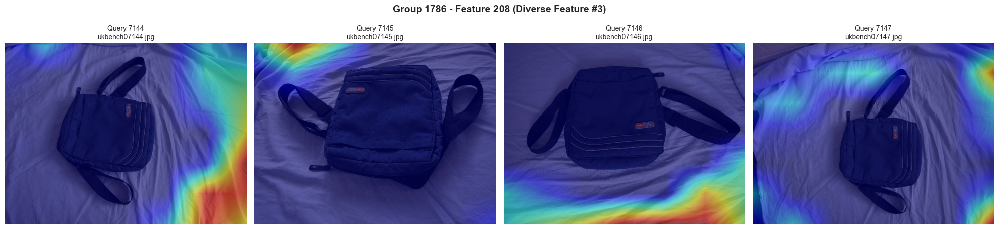


--- Feature 367 (Rank 4) ---


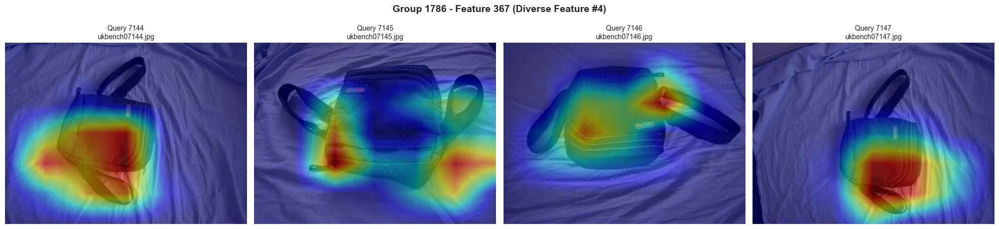


Completed visualizations for Group 1786

GROUP 1787

Top 4 diverse features: [208 283 906 442]
Variance values: [0.00738303 0.00590401 0.00554206 0.00509705]

--- Feature 208 (Rank 1) ---


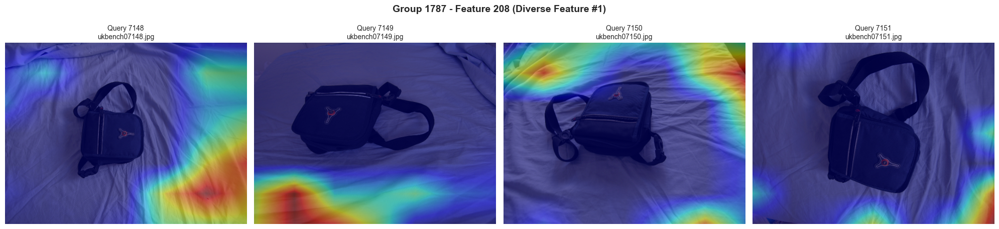


--- Feature 283 (Rank 2) ---


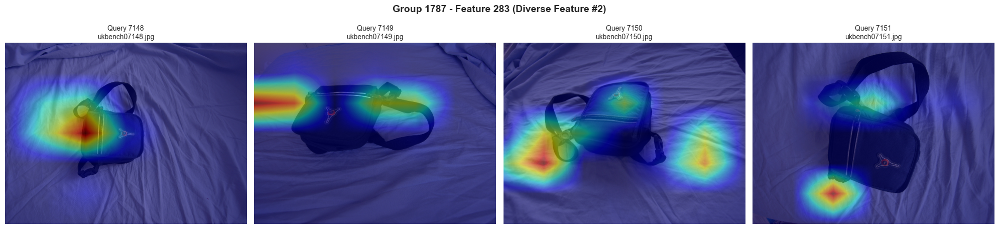


--- Feature 906 (Rank 3) ---


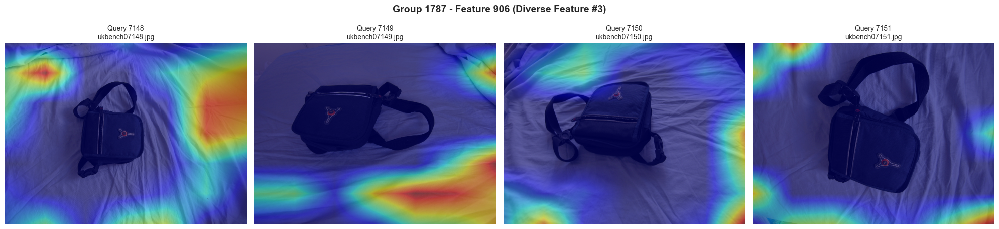


--- Feature 442 (Rank 4) ---


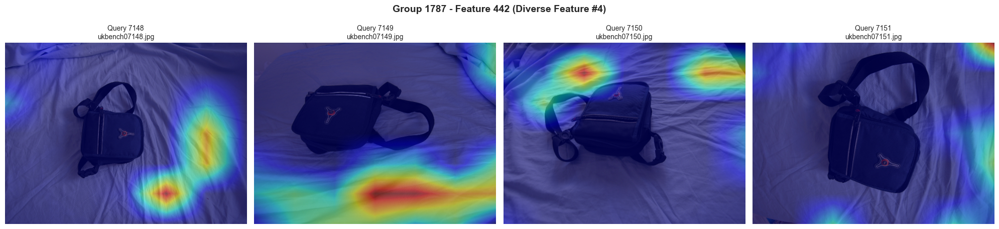


Completed visualizations for Group 1787


In [47]:
# For each group, show Grad-CAM for top 4 diverse features across all queries in that group

for group_id, group_data in diversity_results.items():
    print(f"\n{'='*80}")
    print(f"GROUP {group_id}")
    print(f"{'='*80}")
    
    # Get top 4 diverse features for this group (using 'variance' metric)
    top_diverse_features = group_data['top_diverse_dims_by_metric']['variance'][:4]
    diversity_scores = group_data['top_diverse_values_by_metric']['variance'][:4]
    
    print(f"\nTop 4 diverse features: {top_diverse_features}")
    print(f"Variance values: {diversity_scores}")
    
    # Get all query images for this group
    group_query_indices = group_data['query_indices_in_group']
    
    # For each diverse feature, show activations across all queries in the group
    for feat_idx, feat_dim in enumerate(top_diverse_features):
        print(f"\n--- Feature {feat_dim} (Rank {feat_idx + 1}) ---")
        
        # Create a figure with subplots for all queries
        n_queries = len(group_query_indices)
        fig, axes = plt.subplots(1, n_queries, figsize=(5 * n_queries, 5))
        if n_queries == 1:
            axes = [axes]
        
        for ax_idx, query_idx in enumerate(group_query_indices):
            query_path = image_paths[query_idx]
            img_name = Path(query_path).name
            
            # Compute Grad-CAM - returns (heatmap, original_image)
            heatmap, img_array = extractor.compute_attribution(Path(query_path), [feat_dim])
            
            # Create overlay
            overlay = plot_attribution_overlay(
                heatmap,
                img_array,
                output_path=None,
                alpha=0.5
            )
            
            # Plot
            axes[ax_idx].imshow(overlay)
            axes[ax_idx].set_title(f"Query {query_idx}\n{img_name}", fontsize=10)
            axes[ax_idx].axis('off')
        
        plt.suptitle(f"Group {group_id} - Feature {feat_dim} (Diverse Feature #{feat_idx + 1})", 
                    fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()
        
    print(f"\nCompleted visualizations for Group {group_id}")

In [46]:
print(attribution_maps[0].shape, attribution_maps[1].shape)

(7, 7) (480, 640, 3)


In [ ]:
print(attribution_maps[0].shape, attribution_maps[1].shape)

(7, 7) (480, 640, 3)


## Summary

This notebook provides comprehensive analysis of ResNet-50 deep features:

1. **Feature Loading**: Load cached features from experiments
2. **Query Selection**: Analyze specific images using `query_idx`
3. **Statistical Analysis**: Feature distributions, norms, and patterns
4. **Nearest Neighbors**: Find similar images in feature space
5. **Visualizations**: 2D projections colored by group
6. **Feature Attribution**: Grad-CAM shows what features focus on

**Key Insights:**
- Same-group queries should cluster together
- Feature activations reveal what the model focuses on
- Grad-CAM shows spatial regions contributing to similarity